In [ ]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install scikit-learn
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score 
from sklearn import metrics
from statistics import mean

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 22.0 MB 138 kB/s
     |████████████████████████████████| 102 kB 5.3 MB/s 
     |████████████████████████████████| 690 kB 28.7 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 9.8 MB 51.9 MB/s 
     |████████████████████████████████| 4.7 MB 41.9 MB/s 
     |████████████████████████████████| 296 kB 59.2 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.4.0-py2.py3-none-any.whl size=315269 sha256=e0bdf1c4ca2266fd284d938afa

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving as.csv to as.csv


In [ ]:
import io
dataframe = pd.read_csv(io.BytesIO(uploaded['as.csv']))
dataframe

,sr,rr,t,lm,bo,rem,sr.1,hr,sl
0,93.800,25.680,91.840,16.600,89.840,99.60,1.840,74.20,3
1,91.640,25.104,91.552,15.880,89.552,98.88,1.552,72.76,3
2,60.000,20.000,96.000,10.000,95.000,85.00,7.000,60.00,1
3,85.760,23.536,90.768,13.920,88.768,96.92,0.768,68.84,3
4,48.120,17.248,97.872,6.496,96.248,72.48,8.248,53.12,0
...,...,...,...,...,...,...,...,...,...
930,55.119,17.067,98.788,7.771,93.416,69.10,7.665,50.00,0
931,48.729,19.589,99.000,5.424,93.611,87.53,9.000,50.00,0
932,73.409,20.309,96.479,9.948,88.639,97.24,3.074,50.00,1
933,100.000,21.741,94.600,15.701,86.479,105.00,5.433,54.37,2


In [ ]:
dataframe.head(20)

,sr,rr,t,lm,bo,rem,sr.1,hr,sl
0,93.800,25.680,91.840,16.600,89.840,99.60,1.840,74.20,3
1,91.640,25.104,91.552,15.880,89.552,98.88,1.552,72.76,3
2,60.000,20.000,96.000,10.000,95.000,85.00,7.000,60.00,1
3,85.760,23.536,90.768,13.920,88.768,96.92,0.768,68.84,3
4,48.120,17.248,97.872,6.496,96.248,72.48,8.248,53.12,0
5,56.880,19.376,95.376,9.376,94.064,83.44,6.376,58.44,1
6,47.000,16.800,97.200,5.600,95.800,68.00,7.800,52.00,0
7,50.000,18.000,99.000,8.000,NaN,80.00,9.000,55.00,0
8,45.280,16.112,96.168,4.224,95.112,61.12,7.112,50.28,0
9,55.520,19.104,95.104,9.104,93.656,82.76,6.104,57.76,1


# Data preprocessing

In [ ]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 935 entries, 0 to 934
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sr      934 non-null    float64
 1   rr      932 non-null    float64
 2   t       933 non-null    float64
 3   lm      930 non-null    float64
 4   bo      931 non-null    float64
 5   rem     932 non-null    float64
 6   sr.1    933 non-null    float64
 7   hr      933 non-null    float64
 8   sl      935 non-null    int64  
dtypes: float64(8), int64(1)
memory usage: 65.9 KB


In [ ]:
# checking Null values
dataframe.describe()

,sr,rr,t,lm,bo,rem,sr.1,hr,sl
count,934.000000,932.000000,933.000000,930.000000,931.000000,932.000000,933.000000,933.000000,935.000000
mean,72.642070,21.867236,93.281718,12.038559,90.119812,89.588380,3.885838,62.369089,1.975401
std,19.931045,4.087648,3.703001,4.354184,4.042486,12.132811,3.197621,9.938828,1.415891
min,45.000000,16.000000,85.000000,4.000000,82.000000,60.000000,0.000000,50.000000,0.000000
25%,53.456000,18.316000,90.720000,8.615750,87.425000,81.390000,0.528000,53.600000,1.000000
50%,70.859500,21.075500,93.488000,11.528000,89.984000,91.630000,3.725000,60.640000,2.000000
75%,94.379250,25.464000,96.228000,16.390000,93.561500,100.282500,6.984000,69.640000,3.000000
max,100.000000,30.000000,99.000000,19.000000,96.984000,105.000000,9.000000,85.000000,4.000000


In [ ]:
 dataframe.isnull().sum() #checking null values

sr      1
rr      3
t       2
lm      5
bo      4
rem     3
sr.1    2
hr      2
sl      0
dtype: int64

In [ ]:
#hundling Null values

In [ ]:
mean_value=dataframe['sr'].mean()
dataframe['sr'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['rr'].mean()
dataframe['rr'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['t'].mean()
dataframe['t'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['lm'].mean()
dataframe['lm'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['bo'].mean()
dataframe['bo'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['rem'].mean()
dataframe['rem'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['hr'].mean()
dataframe['hr'].fillna(value=mean_value, inplace=True)

In [ ]:
mean_value=dataframe['sr.1'].mean()
dataframe['sr.1'].fillna(value=mean_value, inplace=True)

In [ ]:
dataframe.describe()

,sr,rr,t,lm,bo,rem,sr.1,hr,sl
count,935.000000,935.000000,935.000000,935.000000,935.000000,935.00000,935.000000,935.000000,935.000000
mean,72.642070,21.867236,93.281718,12.038559,90.119812,89.58838,3.885838,62.369089,1.975401
std,19.920372,4.081078,3.699034,4.342513,4.033820,12.11331,3.194195,9.928181,1.415891
min,45.000000,16.000000,85.000000,4.000000,82.000000,60.00000,0.000000,50.000000,0.000000
25%,53.472000,18.328000,90.728000,8.632000,87.449000,81.42000,0.536000,53.605000,1.000000
50%,70.880000,21.083000,93.488000,11.552000,90.000000,91.57000,3.728000,60.650000,2.000000
75%,94.358500,25.440000,96.222000,16.340000,93.548000,100.28000,6.976000,69.600000,3.000000
max,100.000000,30.000000,99.000000,19.000000,96.984000,105.00000,9.000000,85.000000,4.000000


In [ ]:
dataframe.columns=['snoring_rate', 'respiration_rate', 'body_temperature', 'limb_movement', 'blood_oxygen', \
             'eye_movement', 'sleeping_hours', 'heart_rate', 'stress_level']
dataframe.head()

,snoring_rate,respiration_rate,body_temperature,limb_movement,blood_oxygen,eye_movement,sleeping_hours,heart_rate,stress_level
0,93.80,25.680,91.840,16.600,89.840,99.60,1.840,74.20,3
1,91.64,25.104,91.552,15.880,89.552,98.88,1.552,72.76,3
2,60.00,20.000,96.000,10.000,95.000,85.00,7.000,60.00,1
3,85.76,23.536,90.768,13.920,88.768,96.92,0.768,68.84,3
4,48.12,17.248,97.872,6.496,96.248,72.48,8.248,53.12,0


In [ ]:
dataframe.head()

,snoring_rate,respiration_rate,body_temperature,limb_movement,blood_oxygen,eye_movement,sleeping_hours,heart_rate,stress_level
0,93.80,25.680,91.840,16.600,89.840,99.60,1.840,74.20,3
1,91.64,25.104,91.552,15.880,89.552,98.88,1.552,72.76,3
2,60.00,20.000,96.000,10.000,95.000,85.00,7.000,60.00,1
3,85.76,23.536,90.768,13.920,88.768,96.92,0.768,68.84,3
4,48.12,17.248,97.872,6.496,96.248,72.48,8.248,53.12,0


In [ ]:
dataframe = dataframe.sample(frac=1)

# EDA

In [ ]:
profile = ProfileReport(dataframe, title="EDA Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

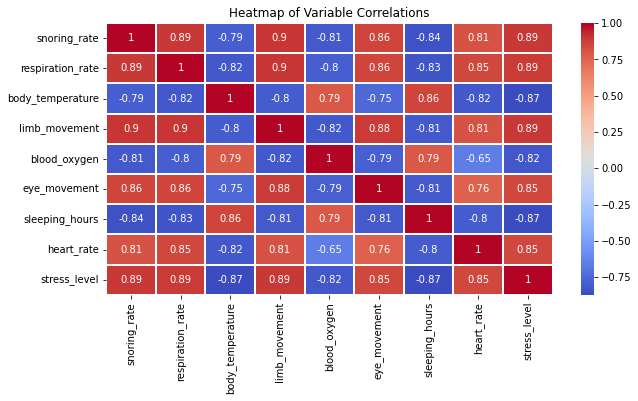

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,5))
sns.heatmap(dataframe.corr(),cmap='coolwarm',annot=True,linecolor='white',linewidths=1)
plt.title('Heatmap of Variable Correlations')
plt.show()

NORMALIZATION OF DATA

In [ ]:
#normalization 
from sklearn.preprocessing import MinMaxScaler

label = 'stress_level'
X = dataframe.drop(label, axis = 1)
Y = dataframe[label]

normalize = MinMaxScaler()

X[X.columns] = normalize.fit_transform(X[X.columns])
X.head()
print(np.shape(X), np.shape(Y))

(935, 8) (935,)


RANDOM OVERSAMPLING

In [ ]:
import imblearn
from imblearn.over_sampling import SMOTE, RandomOverSampler
oversample = RandomOverSampler(sampling_strategy='minority')
X, Y = oversample.fit_resample(X, Y)
print(np.shape(X), np.shape(Y))

(995, 8) (995,)


In [ ]:
from sklearn.model_selection import train_test_split, KFold , StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB, MultinomialNB, CategoricalNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix

import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline

TRAIN TEST

In [ ]:
data = dataframe
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0, stratify=Y)

DIMENSIONALITY REDUCTION USING PCA AND AUTO ENCODERS

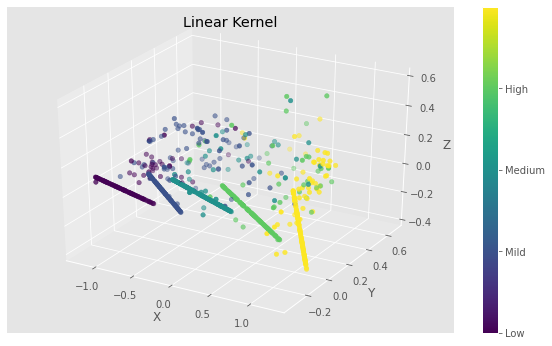

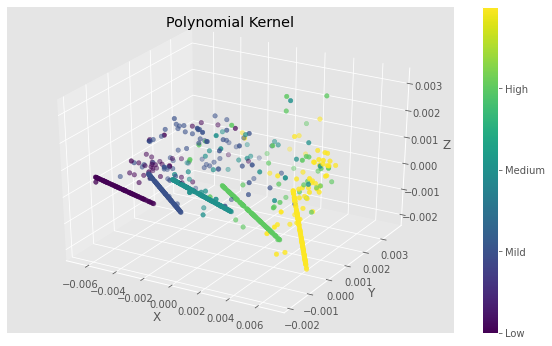

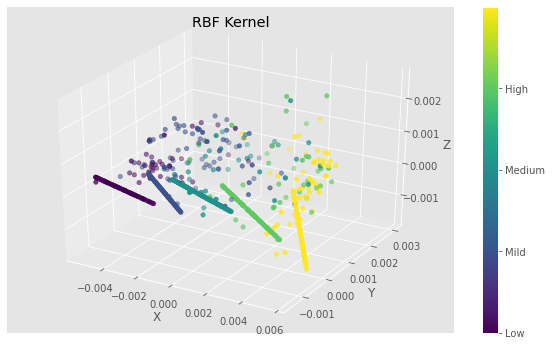

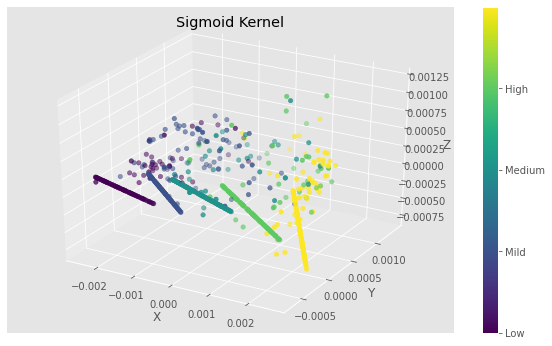

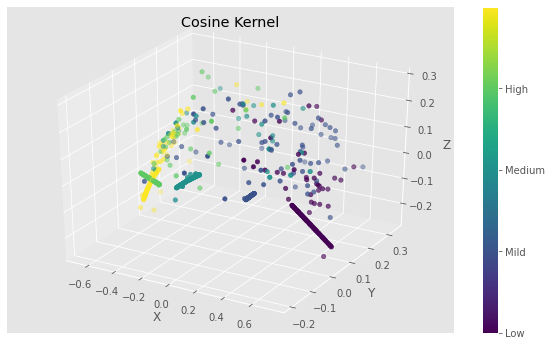

In [ ]:
# dimensionality reduction

from sklearn.decomposition import KernelPCA

names = ['Linear Kernel','Polynomial Kernel','RBF Kernel','Sigmoid Kernel','Cosine Kernel']

classifiers = [
KernelPCA(n_components = 4, kernel = 'linear'),
KernelPCA(n_components = 4, kernel = 'poly', gamma= 0.00001),
KernelPCA(n_components = 4, kernel = 'rbf', gamma= 0.00001), KernelPCA(n_components = 3, kernel = 'sigmoid', gamma= 0.00001), KernelPCA(n_components = 3, kernel = 'cosine',gamma=0.00001)
]

models=zip(names,classifiers)
   
for name, model_param in models:
    X_PCA = model_param.fit_transform(x_train)
    from mpl_toolkits.mplot3d import axes3d
    from matplotlib import style
    style.use('ggplot')
    fig = plt.figure(figsize=(10,6))
    ax1 = fig.add_subplot(111, projection='3d')
    loc = [0,1,2,3]
    classes = ['Low','Mild','Medium','High']
    x3d = X_PCA[:,0]
    y3d = X_PCA[:,1]
    z3d = X_PCA[:,2]
    plot = ax1.scatter(x3d, y3d, z3d, c=y_train, cmap="viridis" )
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    cb = plt.colorbar(plot)
    cb.set_ticks(loc)
    cb.set_ticklabels(classes)
    plt.title(name)
    plt.show()

# Boxplot

<AxesSubplot:xlabel='stress_level', ylabel='respiration_rate'>

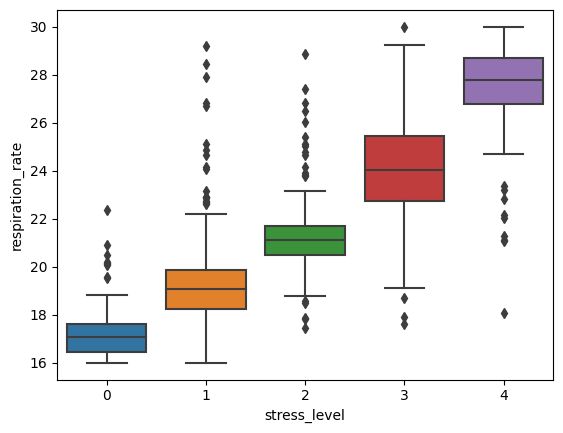

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["respiration_rate"])

<AxesSubplot:xlabel='stress_level', ylabel='snoring_rate'>

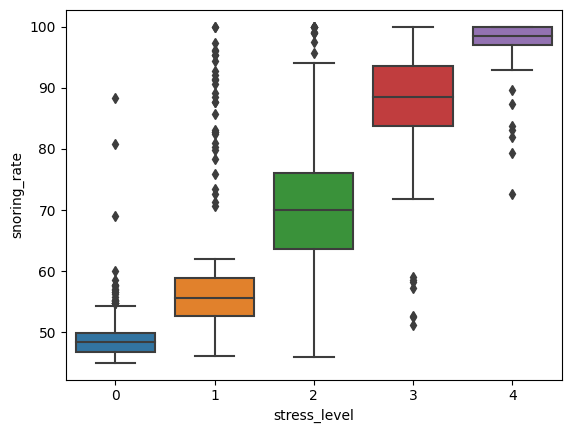

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["snoring_rate"])

<AxesSubplot:xlabel='stress_level', ylabel='body_temperature'>

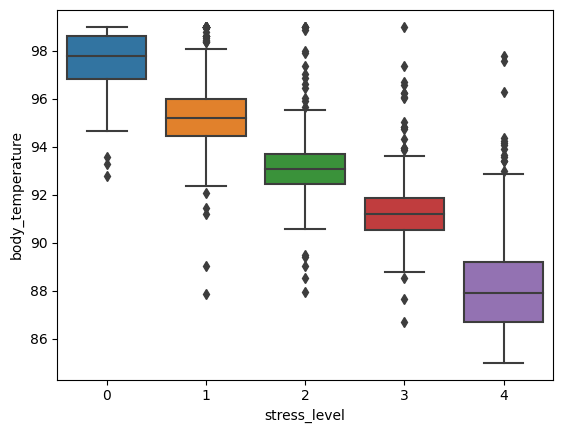

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["body_temperature"])

<AxesSubplot:xlabel='stress_level', ylabel='limb_movement'>

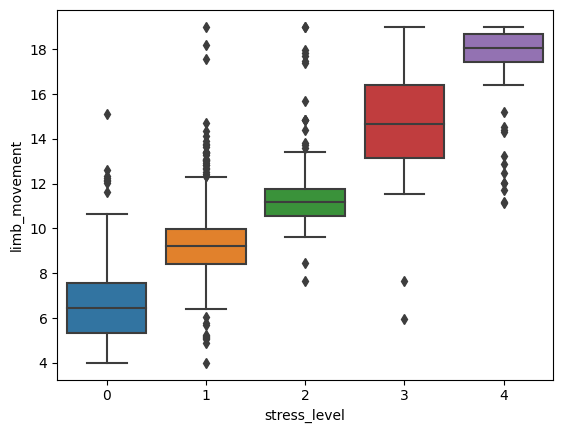

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["limb_movement"])

<AxesSubplot:xlabel='stress_level', ylabel='blood_oxygen'>

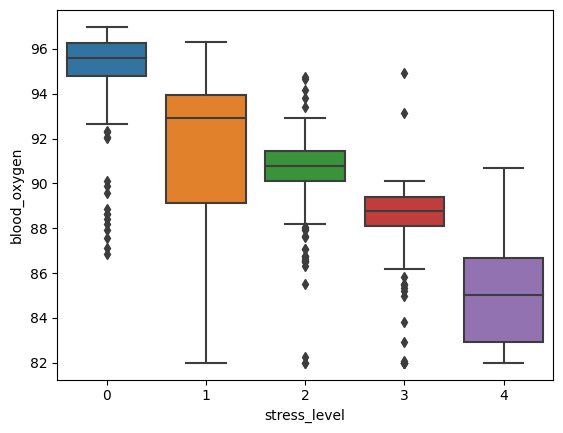

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["blood_oxygen"])

<AxesSubplot:xlabel='stress_level', ylabel='eye_movement'>

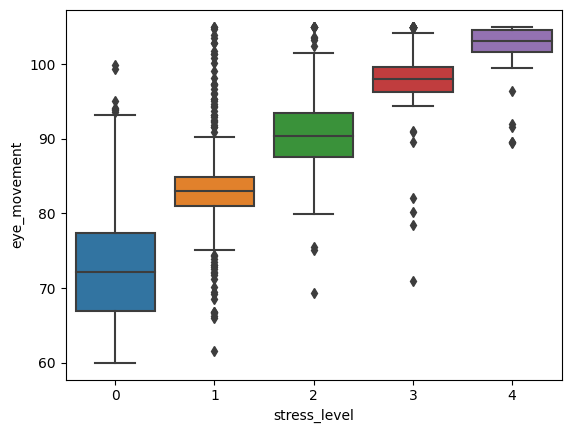

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["eye_movement"])

<AxesSubplot:xlabel='stress_level', ylabel='sleeping_hours'>

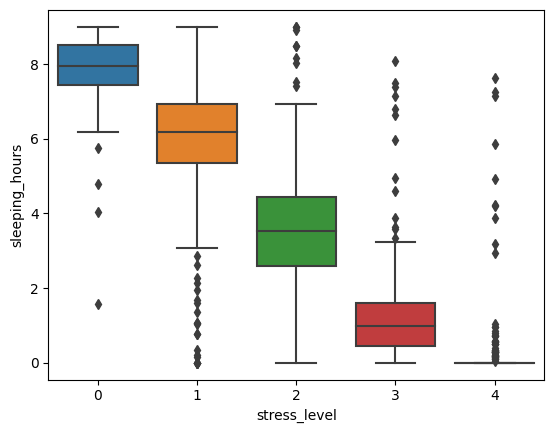

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["sleeping_hours"])

<AxesSubplot:xlabel='stress_level', ylabel='heart_rate'>

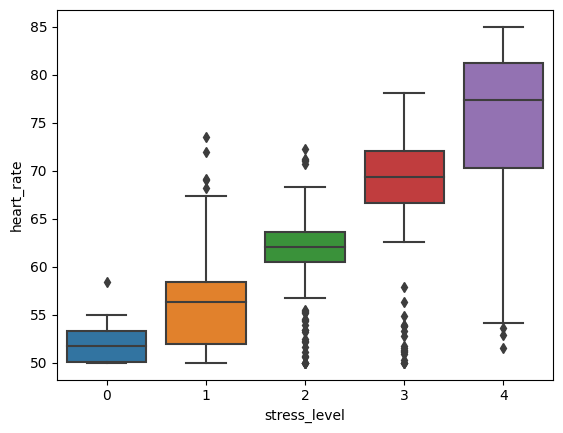

In [ ]:
sns.boxplot(x = dataframe["stress_level"],y =dataframe["heart_rate"])

# LOGISTIC REGRESSION

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(dataframe[["sleeping_hours",'respiration_rate','body_temperature','snoring_rate','body_temperature','limb_movement','heart_rate']], dataframe['stress_level'], \
                                                  test_size=0.2, random_state=8)

In [ ]:
def GridSearchCV_lr(X_train, y_train): 
  pipe_line = Pipeline([('classifier1' , LogisticRegression(random_state = 0))])
  param_grid = [
    {'classifier1' : [LogisticRegression(solver = 'saga', max_iter = 5000, random_state = 0)],
     'classifier1__penalty' : ['l1', 'l2'],
    'classifier1__C' : np.logspace(-4, 4, 10),
    'classifier1__multi_class' : ['ovr', 'multinomial']},
    {'classifier1' : [LogisticRegression(max_iter = 3000, random_state = 0)],
     'classifier1__penalty' : ['l2'],
    'classifier1__C' : np.logspace(-4, 4, 10),
    'classifier1__multi_class' : ['ovr', 'multinomial'], 
     'classifier1__solver' : ['sag', 'newton-cg']}
  ]
  gs = GridSearchCV(estimator=pipe_line,param_grid=param_grid)
  gs.get_params().keys()
  gs_fit = gs.fit(X_train, y_train)
  return gs_fit.best_params_

In [ ]:
print(GridSearchCV_lr(X_train, y_train))

{'classifier1': LogisticRegression(C=0.046415888336127774, max_iter=5000,
                   multi_class='multinomial', random_state=0, solver='saga'), 'classifier1__C': 0.046415888336127774, 'classifier1__multi_class': 'multinomial', 'classifier1__penalty': 'l2'}


In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(multi_class='multinomial', solver = 'lbfgs',max_iter=5000)
model.fit(X_train,y_train)


LogisticRegression(max_iter=5000, multi_class='multinomial')

In [ ]:
from sklearn import metrics
predict = model.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")



Accuracy: 84.49197860962568 %
Precision: 86.10875286019116 %
F1: 85.06198195093215 %
Recall: 84.44328827811954 %


# NAIVE BAYES

In [ ]:
#gaussian
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [ ]:
from sklearn import metrics
predict = gnb.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 80.74866310160428 %
Precision: 81.56549503026265 %
F1: 81.0729000648449 %
Recall: 80.82639633538385 %


In [ ]:
# Multinomial
from sklearn.naive_bayes import MultinomialNB
mnb = MultinomialNB()
mnb.fit(X_train, y_train)
predict = mnb.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")


Accuracy: 83.9572192513369 %
Precision: 84.48914870295944 %
F1: 84.06730747337664 %
Recall: 83.89275636322593 %


# Random Forest

In [ ]:
def GridSearchCV_rf(X_train, y_train): 
  classifier = RandomForestClassifier(random_state = 7)
  param_grid = {
      'n_estimators': [10,30,50,100,125,135,150,160, 200, 400], 
      'max_features': ['auto', 'sqrt', 'log2'], 
      "criterion" : ["gini", "entropy"], 
  }
  gs = GridSearchCV(estimator = classifier, param_grid=param_grid, cv = 3,  n_jobs  = -1) 
  gs_fit = gs.fit(X_train, y_train)
  return gs_fit.best_estimator_

In [ ]:
print(GridSearchCV_rf(X_train, y_train))

RandomForestClassifier(n_estimators=30, random_state=7)


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 100, criterion="entropy")  
classifier.fit(X_train, y_train)
predict = classifier.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 82.88770053475936 %
Precision: 84.39155673846541 %
F1: 83.35093373350438 %
Recall: 82.74512293771281 %


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 200, criterion="entropy")  
classifier.fit(X_train, y_train)
predict = classifier.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 84.49197860962568 %
Precision: 85.40952380952382 %
F1: 84.62499609890699 %
Recall: 84.11882019301315 %


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 100, criterion="gini")  
classifier.fit(X_train, y_train)
predict = classifier.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 86.09625668449198 %
Precision: 87.86723646723648 %
F1: 86.24623627966803 %
Recall: 85.32094785258761 %


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 200, criterion="gini")  
classifier.fit(X_train, y_train)
predict = classifier.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 85.02673796791443 %
Precision: 85.95494505494506 %
F1: 84.88047138047138 %
Recall: 84.27041593769401 %


# ADABOOST

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier(base_estimator = None,n_estimators = 10,random_state = 1)
model.fit(X_train,y_train)
predict = model.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")


Accuracy: 66.84491978609626 %
Precision: 71.85427962783587 %
F1: 64.47283644799906 %
Recall: 70.98458105235434 %


# With PCA

In [ ]:
#we are going to use multilevel percepteon and then get the accuracy 

In [ ]:
from sklearn.decomposition import PCA
#Use Principal Component Analysis (PCA) to reduce the number of features
pca = PCA(n_components = 4)
pca.fit(dataframe)
data_pca4 = pca.transform(dataframe)
data_pca4 = pd.DataFrame(data_pca4,columns=['PC1','PC2','PC3','PC4'])
data_pca4.head()

,PC1,PC2,PC3,PC4
0,-37.363964,-2.840813,-7.928219,-1.316541
1,29.086899,-1.692305,-1.112722,-3.922402
2,-34.740970,-1.415797,-6.145557,1.565194
3,15.381421,-2.884276,-1.438856,-3.029330
4,0.701231,-1.598216,-0.069955,-0.914579


# LOGISTIC REGRESSION

In [ ]:
from sklearn.model_selection import train_test_split
Xp_train, Xp_test, yp_train, yp_test=train_test_split(data_pca4[['PC1','PC2','PC3','PC4']], dataframe['stress_level'], \
                                                  test_size=0.2, random_state=8)

In [ ]:
def GridSearchCV_lr(X_train, y_train): 
  pipe_line = Pipeline([('classifier1' , LogisticRegression(random_state = 0))])
  param_grid = [
    {'classifier1' : [LogisticRegression(solver = 'saga', max_iter = 5000, random_state = 0)],
     'classifier1__penalty' : ['l1', 'l2'],
    'classifier1__C' : np.logspace(-4, 4, 10),
    'classifier1__multi_class' : ['ovr', 'multinomial']},
    {'classifier1' : [LogisticRegression(max_iter = 3000, random_state = 0)],
     'classifier1__penalty' : ['l2'],
    'classifier1__C' : np.logspace(-4, 4, 10),
    'classifier1__multi_class' : ['ovr', 'multinomial'], 
     'classifier1__solver' : ['sag', 'newton-cg']}
  ]
  gs = GridSearchCV(estimator=pipe_line,param_grid=param_grid)
  gs.get_params().keys()
  gs_fit = gs.fit(X_train, y_train)
  return gs_fit.best_params_

In [ ]:
print(GridSearchCV_lr(X_train, y_train))

{'classifier1': LogisticRegression(C=0.046415888336127774, max_iter=5000,
                   multi_class='multinomial', random_state=0, solver='saga'), 'classifier1__C': 0.046415888336127774, 'classifier1__multi_class': 'multinomial', 'classifier1__penalty': 'l2'}


In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(multi_class='multinomial', solver = 'lbfgs',max_iter=5000)
model.fit(Xp_train,yp_train)


LogisticRegression(max_iter=5000, multi_class='multinomial')

In [ ]:
from sklearn import metrics
predict = model.predict(Xp_test)
print("Accuracy:", metrics.accuracy_score(yp_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 86.63101604278076 %
Precision: 87.5005930430657 %
F1: 86.47030279214188 %
Recall: 85.92030682694659 %


# NAIVE BAYES

In [ ]:
#gaussian
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(Xp_train, yp_train)

GaussianNB()

In [ ]:
from sklearn import metrics
predict = gnb.predict(Xp_test)
print("Accuracy:", metrics.accuracy_score(yp_test, predict)*100,"%")
print("Precision:", metrics.precision_score(yp_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(yp_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(yp_test, predict, average='macro')*100,"%")

Accuracy: 80.74866310160428 %
Precision: 82.8947061239185 %
F1: 80.45187762398902 %
Recall: 79.96817916737213 %


# Random Forest

In [ ]:
def GridSearchCV_rf(X_train, y_train): 
  classifier = RandomForestClassifier(random_state = 7)
  param_grid = {
      'n_estimators': [10,30,50,100,125,135,150,160, 200, 400], 
      'max_features': ['auto', 'sqrt', 'log2'], 
      "criterion" : ["gini", "entropy"], 
  }
  gs = GridSearchCV(estimator = classifier, param_grid=param_grid, cv = 3,  n_jobs  = -1) 
  gs_fit = gs.fit(X_train, y_train)
  return gs_fit.best_estimator_

In [ ]:
print(GridSearchCV_rf(X_train, y_train))

RandomForestClassifier(n_estimators=30, random_state=7)


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 100, criterion="entropy")  
classifier.fit(Xp_train, yp_train)
predict = classifier.predict(Xp_test)
print("Accuracy:", metrics.accuracy_score(yp_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 85.02673796791443 %
Precision: 85.43553253898082 %
F1: 84.79074479241717 %
Recall: 84.44424299715936 %


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 200, criterion="entropy")  
classifier.fit(Xp_train, yp_train)
predict = classifier.predict(Xp_test)
print("Accuracy:", metrics.accuracy_score(yp_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 84.49197860962568 %
Precision: 84.84338993049795 %
F1: 84.18652952140583 %
Recall: 83.84187642267247 %


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 100, criterion="gini")  
classifier.fit(Xp_train, yp_train)
predict = classifier.predict(Xp_test)
print("Accuracy:", metrics.accuracy_score(yp_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 86.63101604278076 %
Precision: 86.47907293933366 %
F1: 86.06320930274507 %
Recall: 85.8179402524597 %


In [ ]:
from sklearn.ensemble import RandomForestClassifier  
classifier= RandomForestClassifier(n_estimators= 200, criterion="gini")  
classifier.fit(Xp_train, yp_train)
predict = classifier.predict(Xp_test)
print("Accuracy:", metrics.accuracy_score(yp_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 85.56149732620321 %
Precision: 85.32814782638162 %
F1: 84.9405851436871 %
Recall: 84.68011973963918 %


# ADABOOST

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier(base_estimator = None,n_estimators = 10,random_state = 1)
model.fit(X_train,y_train)
predict = model.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, predict)*100,"%")
print("Precision:", metrics.precision_score(y_test, predict, average='macro')*100, "%")
print("F1:", metrics.f1_score(y_test, predict, average='macro')*100,"%")
print("Recall:", metrics.recall_score(y_test, predict, average='macro')*100,"%")

Accuracy: 66.84491978609626 %
Precision: 71.85427962783587 %
F1: 64.47283644799906 %
Recall: 70.98458105235434 %


Evaluation matrix

NameError: ignored

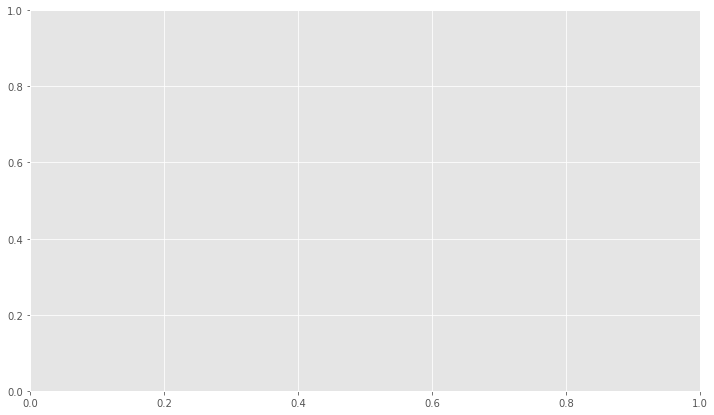

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# set width of bar
barWidth = 0.09
fig = plt.subplots(figsize =(12,7))
 
# set height of bar
LogisticRegression_arr = [accuracy_models[0],precision_models[0],recall_models[0],f1score_models[0]]
GaussianNB_arr = [accuracy_models[4],precision_models[4],recall_models[4],f1score_models[4]]
#DecisionTreeClassifier_arr = [accuracy_models[2],precision_models[2],recall_models[2],f1score_models[2]]
RandomForestClassifier_arr = [accuracy_models[3],precision_models[3],recall_models[3],f1score_models[3]]
#KNN_arr = [accuracy_models[1],precision_models[1],recall_models[1],f1score_models[1]]#
# Set position of bar on X axis
br1 = np.arange(len(LogisticRegression_arr))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
#br4 = [x + barWidth for x in br3]


# Make the plot
plt.bar(br1, LogisticRegression_arr, color ='#00FFFF', width = barWidth,label ='Logistic Regression')
plt.bar(br2, GaussianNB_arr, color ='#FF00FF', width = barWidth, label ='Naive Bayes')
plt.bar(br3, RandomForestClassifier_arr, color ='#00FF00', width = barWidth, label ='Random Forest')
#plt.bar(br4, AdaBoost, color ='teal', width = barWidth, label ='Boosting')



# Adding Xticks
plt.xlabel('Metrics', fontweight ='bold', fontsize = 15)
plt.ylabel('Values', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(LogisticRegression_arr))],
        ['Accuracy', 'Precision', 'Recall', 'F1-score'])
 
plt.legend()
plt.show()